### Reference for Algorithm: 
### Olfati-Saber, R. (2006): Flocking for multi-agent dynamic systems: Algorithms and theory. IEEE Transactions on Automatic Control. 
#### https://ieeexplore.ieee.org/document/1605401

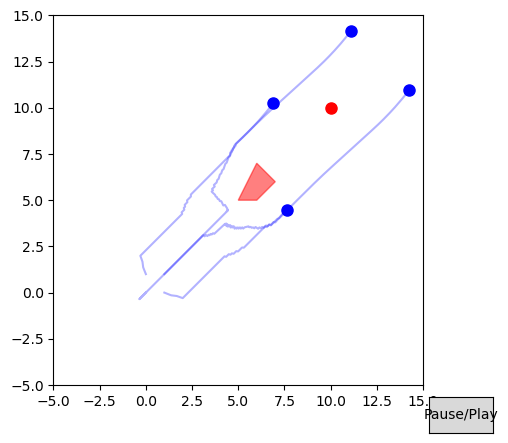

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FuncAnimation
from matplotlib.widgets import Button
from IPython.display import HTML

# UAV parameters
n_drones = 4
dt = 0.1  # Time step
max_speed = 1.0
max_acceleration = 0.5
target = np.array([10.0, 10.0])  # Target location
initial_positions = np.array([[0.0, 0.0], [1.0, 0.0], [0.0, 1.0], [1.0, 1.0]])  # Formation (Square)
initial_velocities = np.zeros_like(initial_positions)
formation_offset = np.array([[-1, 0], [0, 1], [1, 0], [0, -1]])

# Obstacle (polygonal shape for simplicity)
obstacle = Polygon([[5, 5], [6, 7], [7, 6], [6, 5]], closed=True, edgecolor='r', facecolor='r', alpha=0.5)

# Helper functions for UAV movement and obstacle avoidance
def distance(p1, p2):
    return np.linalg.norm(p1 - p2)

def point_to_segment_distance(point, seg_start, seg_end):
    """ Calculate the shortest distance from a point to a line segment. """
    seg_vec = seg_end - seg_start
    point_vec = point - seg_start
    seg_len = np.linalg.norm(seg_vec)
    if seg_len == 0:
        return np.linalg.norm(point - seg_start)
    proj = np.dot(point_vec, seg_vec) / seg_len
    proj = np.clip(proj, 0, seg_len)
    closest_point = seg_start + proj * seg_vec / seg_len
    return np.linalg.norm(point - closest_point)

def obstacle_repulsion(pos, obstacle):
    """ Compute repulsion force from obstacle boundary. """
    repulsion = np.zeros(2)
    obstacle_vertices = obstacle.get_xy()
    
    # Loop through all edges of the polygon (obstacle)
    for i in range(len(obstacle_vertices) - 1):
        seg_start = obstacle_vertices[i]
        seg_end = obstacle_vertices[i + 1]
        
        # Calculate the shortest distance from the drone to the current segment
        dist = point_to_segment_distance(pos, seg_start, seg_end)
        if dist < 1.5:  # Repulsion threshold
            # Direction of repulsion (from drone to segment)
            direction_to_segment = pos - (seg_start + seg_end) / 2
            repulsion += direction_to_segment / (dist + 1e-6) * 0.5  # Repulsion strength
    
    return repulsion

def update_positions(positions, velocities):
    """ Update UAV positions based on velocities. """
    return positions + velocities * dt

def update_velocities(positions, velocities, target, formation_offset, max_speed, max_acceleration):
    """ Update UAV velocities to steer towards target, avoid obstacles, and maintain formation. """
    velocities_new = np.zeros_like(velocities)
    
    # 1. Target Attraction (simple proportional controller)
    direction_to_target = target - np.mean(positions, axis=0)
    distance_to_target = np.linalg.norm(direction_to_target)
    desired_velocity = direction_to_target / distance_to_target * min(max_speed, distance_to_target)
    velocities_new += desired_velocity  # Move all drones toward the same target
    
    # 2. Formation Control via Laplacian Consensus
    for i in range(n_drones):
        for j in range(n_drones):
            if i != j:
                direction_to_neighbor = positions[j] - positions[i]
                distance_to_neighbor = np.linalg.norm(direction_to_neighbor)
                if distance_to_neighbor < 2:  # Repulsion range to avoid collision
                    velocities_new[i] -= direction_to_neighbor / distance_to_neighbor * 0.5
    
    # 3. Obstacle Avoidance using boundary-based repulsion
    for i in range(n_drones):
        repulsion = obstacle_repulsion(positions[i], obstacle)
        velocities_new[i] += repulsion
    
    # 4. Collision Avoidance: Apply basic repulsion between agents
    for i in range(n_drones):
        for j in range(n_drones):
            if i != j:
                dist = distance(positions[i], positions[j])
                if dist < 2:  # Repulsion range to avoid collision
                    direction = positions[i] - positions[j]
                    velocities_new[i] += direction / (dist + 1e-6) * 0.5  # Repulsion force
    
    # Cap velocities to max speed and acceleration
    for i in range(n_drones):
        speed = np.linalg.norm(velocities_new[i])
        if speed > max_speed:
            velocities_new[i] = velocities_new[i] / speed * max_speed
    
    return velocities_new

# Set up plot for simulation
fig, ax = plt.subplots()
ax.set_xlim(-5, 15)
ax.set_ylim(-5, 15)
ax.set_aspect('equal')
ax.add_patch(obstacle)

# Plot initial UAVs
uav_plot, = ax.plot([], [], 'bo', markersize=8)
target_plot, = ax.plot([], [], 'ro', markersize=8)
trajectory_plots = [ax.plot([], [], 'b-', alpha=0.3)[0] for _ in range(n_drones)]

# Initialize state
positions = initial_positions.copy()
velocities = initial_velocities.copy()
trajectories = [np.array([pos]) for pos in positions]

# Control the animation pause/play
animation_running = True  # Initially set to run
def toggle_animation(event):
    global animation_running
    animation_running = not animation_running

# Update function for animation
def update(frame):
    global positions, velocities
    
    # Check if all drones are close enough to the target, if so stop them
    if np.all([distance(pos, target) < 0.1 for pos in positions]):  # Check if all drones reached target
        velocities[:] = np.zeros_like(velocities)  # Stop all drones when they reach the target
    
    if animation_running:
        # Update velocities based on control laws
        velocities = update_velocities(positions, velocities, target, formation_offset, max_speed, max_acceleration)
        
        # Update positions
        positions = update_positions(positions, velocities)
    
    # Update plots
    uav_plot.set_data(positions[:, 0], positions[:, 1])
    
    # Correct target plot
    target_plot.set_data([target[0]], [target[1]])  # Pass target as arrays
    
    # Update trajectories
    for i in range(n_drones):
        trajectories[i] = np.vstack((trajectories[i], positions[i]))
        trajectory_plots[i].set_data(trajectories[i][:, 0], trajectories[i][:, 1])
    
    return uav_plot, target_plot, *trajectory_plots

# Set up the pause/play button
ax_button = plt.axes([0.81, 0.01, 0.1, 0.075])
button = Button(ax_button, 'Pause/Play')

# Connect the button event to the toggle function
button.on_clicked(toggle_animation)

# Create animation
ani = FuncAnimation(fig, update, frames=200, interval=100, blit=True)

# Display animation in Jupyter Notebook
HTML(ani.to_jshtml())

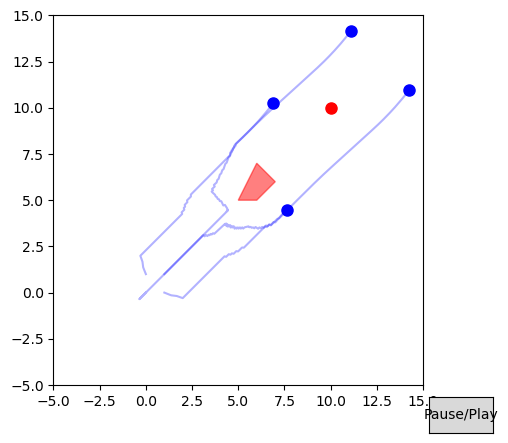

In [34]:
# --- Block 1: Import Required Libraries ---
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FuncAnimation
from matplotlib.widgets import Button
from IPython.display import HTML

# --- Block 2: Define UAV Parameters and Initial Setup ---
n_drones = 4
dt = 0.1  # Time step
max_speed = 1.0
max_acceleration = 0.5
target = np.array([10.0, 10.0])  # Target location

# Initial positions and velocities of drones (Formation: square)
initial_positions = np.array([[0.0, 0.0], [1.0, 0.0], [0.0, 1.0], [1.0, 1.0]])  # Formation (Square)
initial_velocities = np.zeros_like(initial_positions)
formation_offset = np.array([[-1, 0], [0, 1], [1, 0], [0, -1]])

# Obstacle (polygonal shape for simplicity)
obstacle = Polygon([[5, 5], [6, 7], [7, 6], [6, 5]], closed=True, edgecolor='r', facecolor='r', alpha=0.5)

# --- Block 3: Define Helper Functions ---
def distance(p1, p2):
    """Calculate Euclidean distance between two points."""
    return np.linalg.norm(p1 - p2)

def point_to_segment_distance(point, seg_start, seg_end):
    """ Calculate the shortest distance from a point to a line segment. """
    seg_vec = seg_end - seg_start
    point_vec = point - seg_start
    seg_len = np.linalg.norm(seg_vec)
    if seg_len == 0:
        return np.linalg.norm(point - seg_start)
    proj = np.dot(point_vec, seg_vec) / seg_len
    proj = np.clip(proj, 0, seg_len)
    closest_point = seg_start + proj * seg_vec / seg_len
    return np.linalg.norm(point - closest_point)

def obstacle_repulsion(pos, obstacle):
    """ Compute repulsion force from obstacle boundary. """
    repulsion = np.zeros(2)
    obstacle_vertices = obstacle.get_xy()
    
    # Loop through all edges of the polygon (obstacle)
    for i in range(len(obstacle_vertices) - 1):
        seg_start = obstacle_vertices[i]
        seg_end = obstacle_vertices[i + 1]
        
        # Calculate the shortest distance from the drone to the current segment
        dist = point_to_segment_distance(pos, seg_start, seg_end)
        if dist < 1.5:  # Repulsion threshold
            # Direction of repulsion (from drone to segment)
            direction_to_segment = pos - (seg_start + seg_end) / 2
            repulsion += direction_to_segment / (dist + 1e-6) * 0.5  # Repulsion strength
    
    return repulsion

def update_positions(positions, velocities):
    """ Update UAV positions based on velocities. """
    return positions + velocities * dt

def update_velocities(positions, velocities, target, formation_offset, max_speed, max_acceleration):
    """ Update UAV velocities to steer towards target, avoid obstacles, and maintain formation. """
    velocities_new = np.zeros_like(velocities)
    
    # 1. Target Attraction (simple proportional controller)
    direction_to_target = target - np.mean(positions, axis=0)
    distance_to_target = np.linalg.norm(direction_to_target)
    desired_velocity = direction_to_target / distance_to_target * min(max_speed, distance_to_target)
    velocities_new += desired_velocity  # Move all drones toward the same target
    
    # 2. Formation Control via Laplacian Consensus (adjust velocity to keep formation)
    for i in range(n_drones):
        for j in range(n_drones):
            if i != j:
                direction_to_neighbor = positions[j] - positions[i]
                distance_to_neighbor = np.linalg.norm(direction_to_neighbor)
                if distance_to_neighbor < 2:  # Repulsion range to avoid collision
                    velocities_new[i] -= direction_to_neighbor / distance_to_neighbor * 0.5
    
    # 3. Obstacle Avoidance using boundary-based repulsion
    for i in range(n_drones):
        repulsion = obstacle_repulsion(positions[i], obstacle)
        velocities_new[i] += repulsion
    
    # 4. Collision Avoidance: Apply basic repulsion between agents
    for i in range(n_drones):
        for j in range(n_drones):
            if i != j:
                dist = distance(positions[i], positions[j])
                if dist < 2:  # Repulsion range to avoid collision
                    direction = positions[i] - positions[j]
                    velocities_new[i] += direction / (dist + 1e-6) * 0.5  # Repulsion force
    
    # Cap velocities to max speed and acceleration
    for i in range(n_drones):
        speed = np.linalg.norm(velocities_new[i])
        if speed > max_speed:
            velocities_new[i] = velocities_new[i] / speed * max_speed
    
    return velocities_new

# --- Block 4: Set up the Plot for Simulation ---
fig, ax = plt.subplots()
ax.set_xlim(-5, 15)
ax.set_ylim(-5, 15)
ax.set_aspect('equal')
ax.add_patch(obstacle)

# Plot initial UAVs
uav_plot, = ax.plot([], [], 'bo', markersize=8)
target_plot, = ax.plot([], [], 'ro', markersize=8)
trajectory_plots = [ax.plot([], [], 'b-', alpha=0.3)[0] for _ in range(n_drones)]

# Initialize state
positions = initial_positions.copy()
velocities = initial_velocities.copy()
trajectories = [np.array([pos]) for pos in positions]

# --- Block 5: Pause/Play Button Logic ---
animation_running = True  # Initially set to run
def toggle_animation(event):
    global animation_running
    animation_running = not animation_running

# --- Block 6: Update Function for Animation ---
def update(frame):
    global positions, velocities
    
    # Check if all drones are close enough to the target, if so stop them
    if np.all([distance(pos, target) < 0.1 for pos in positions]):  # Check if all drones reached target
        velocities[:] = np.zeros_like(velocities)  # Stop all drones when they reach the target
    
    if animation_running:
        # Update velocities based on control laws
        velocities = update_velocities(positions, velocities, target, formation_offset, max_speed, max_acceleration)
        
        # Update positions
        positions = update_positions(positions, velocities)
    
    # Update plots
    uav_plot.set_data(positions[:, 0], positions[:, 1])
    
    # Correct target plot
    target_plot.set_data([target[0]], [target[1]])  # Pass target as arrays
    
    # Update trajectories
    for i in range(n_drones):
        trajectories[i] = np.vstack((trajectories[i], positions[i]))
        trajectory_plots[i].set_data(trajectories[i][:, 0], trajectories[i][:, 1])
    
    return uav_plot, target_plot, *trajectory_plots

# --- Block 7: Create Animation and Display ---
# Set up the pause/play button
ax_button = plt.axes([0.81, 0.01, 0.1, 0.075])
button = Button(ax_button, 'Pause/Play')

# Connect the button event to the toggle function
button.on_clicked(toggle_animation)

# Create animation
ani = FuncAnimation(fig, update, frames=200, interval=100, blit=True)

# Display animation in Jupyter Notebook
HTML(ani.to_jshtml())

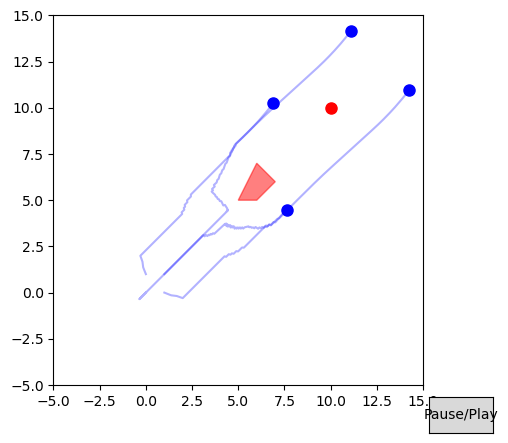

In [46]:
# --- Block 1: Import Required Libraries ---
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FuncAnimation
from matplotlib.widgets import Button
from IPython.display import HTML

# --- Block 2: Define UAV Parameters and Initial Setup ---
n_drones = 4
dt = 0.1  # Time step
max_speed = 1.0
max_acceleration = 0.5
target = np.array([10.0, 10.0])  # Target location

# Initial positions and velocities of drones (Formation: square)
initial_positions = np.array([[0.0, 0.0], [1.0, 0.0], [0.0, 1.0], [1.0, 1.0]])  # Formation (Square)
initial_velocities = np.zeros_like(initial_positions)
formation_offset = np.array([[-1, 0], [0, 1], [1, 0], [0, -1]])

# Obstacle (polygonal shape for simplicity)
obstacle = Polygon([[5, 5], [6, 7], [7, 6], [6, 5]], closed=True, edgecolor='r', facecolor='r', alpha=0.5)

# --- Block 3: Define Helper Functions ---
def distance(p1, p2):
    """Calculate Euclidean distance between two points."""
    return np.linalg.norm(p1 - p2)

def point_to_segment_distance(point, seg_start, seg_end):
    """ Calculate the shortest distance from a point to a line segment. """
    seg_vec = seg_end - seg_start
    point_vec = point - seg_start
    seg_len = np.linalg.norm(seg_vec)
    if seg_len == 0:
        return np.linalg.norm(point - seg_start)
    proj = np.dot(point_vec, seg_vec) / seg_len
    proj = np.clip(proj, 0, seg_len)
    closest_point = seg_start + proj * seg_vec / seg_len
    return np.linalg.norm(point - closest_point)

def obstacle_repulsion(pos, obstacle):
    """ Compute repulsion force from obstacle boundary. """
    repulsion = np.zeros(2)
    obstacle_vertices = obstacle.get_xy()
    
    # Loop through all edges of the polygon (obstacle)
    for i in range(len(obstacle_vertices) - 1):
        seg_start = obstacle_vertices[i]
        seg_end = obstacle_vertices[i + 1]
        
        # Calculate the shortest distance from the drone to the current segment
        dist = point_to_segment_distance(pos, seg_start, seg_end)
        if dist < 1.5:  # Repulsion threshold
            # Direction of repulsion (from drone to segment)
            direction_to_segment = pos - (seg_start + seg_end) / 2
            repulsion += direction_to_segment / (dist + 1e-6) * 0.5  # Repulsion strength
    
    return repulsion

def update_positions(positions, velocities):
    """ Update UAV positions based on velocities. """
    return positions + velocities * dt

def update_velocities(positions, velocities, target, formation_offset, max_speed, max_acceleration):
    """ Update UAV velocities to steer towards target, avoid obstacles, and maintain formation. """
    velocities_new = np.zeros_like(velocities)
    
    # 1. Target Attraction (simple proportional controller)
    direction_to_target = target - np.mean(positions, axis=0)
    distance_to_target = np.linalg.norm(direction_to_target)
    desired_velocity = direction_to_target / distance_to_target * min(max_speed, distance_to_target)
    velocities_new += desired_velocity  # Move all drones toward the same target
    
    # 2. Formation Control via Laplacian Consensus (adjust velocity to keep formation)
    for i in range(n_drones):
        for j in range(n_drones):
            if i != j:
                direction_to_neighbor = positions[j] - positions[i]
                distance_to_neighbor = np.linalg.norm(direction_to_neighbor)
                if distance_to_neighbor < 2:  # Repulsion range to avoid collision
                    velocities_new[i] -= direction_to_neighbor / distance_to_neighbor * 0.5
    
    # 3. Obstacle Avoidance using boundary-based repulsion
    for i in range(n_drones):
        repulsion = obstacle_repulsion(positions[i], obstacle)
        velocities_new[i] += repulsion
    
    # 4. Collision Avoidance: Apply basic repulsion between agents
    for i in range(n_drones):
        for j in range(n_drones):
            if i != j:
                dist = distance(positions[i], positions[j])
                if dist < 2:  # Repulsion range to avoid collision
                    direction = positions[i] - positions[j]
                    velocities_new[i] += direction / (dist + 1e-6) * 0.5  # Repulsion force
    
    # Cap velocities to max speed and acceleration
    for i in range(n_drones):
        speed = np.linalg.norm(velocities_new[i])
        if speed > max_speed:
            velocities_new[i] = velocities_new[i] / speed * max_speed
    
    return velocities_new

# --- Block 4: Set up the Plot for Simulation ---
fig, ax = plt.subplots()
ax.set_xlim(-5, 15)
ax.set_ylim(-5, 15)
ax.set_aspect('equal')
ax.add_patch(obstacle)

# Plot initial UAVs
uav_plot, = ax.plot([], [], 'bo', markersize=8)
target_plot, = ax.plot([], [], 'ro', markersize=8)
trajectory_plots = [ax.plot([], [], 'b-', alpha=0.3)[0] for _ in range(n_drones)]

# Initialize state
positions = initial_positions.copy()
velocities = initial_velocities.copy()
trajectories = [np.array([pos]) for pos in positions]

# --- Block 5: Pause/Play Button Logic ---
animation_running = True  # Initially set to run
def toggle_animation(event):
    global animation_running
    animation_running = not animation_running

# --- Block 6: Update Function for Animation ---
def update(frame):
    global positions, velocities
    
    # Check if all drones are close enough to the target, if so stop them
    if np.all([distance(pos, target) < 0.1 for pos in positions]):  # Check if all drones reached target
        velocities[:] = np.zeros_like(velocities)  # Stop all drones when they reach the target
    
    if animation_running:
        # Update velocities based on control laws
        velocities = update_velocities(positions, velocities, target, formation_offset, max_speed, max_acceleration)
        
        # Update positions
        positions = update_positions(positions, velocities)
    
    # Update plots
    uav_plot.set_data(positions[:, 0], positions[:, 1])
    
    # Correct target plot
    target_plot.set_data([target[0]], [target[1]])  # Pass target as arrays
    
    # Update trajectories
    for i in range(n_drones):
        trajectories[i] = np.vstack((trajectories[i], positions[i]))
        trajectory_plots[i].set_data(trajectories[i][:, 0], trajectories[i][:, 1])
    
    return uav_plot, target_plot, *trajectory_plots

# --- Block 7: Create Animation and Display ---
# Set up the pause/play button
ax_button = plt.axes([0.81, 0.01, 0.1, 0.075])
button = Button(ax_button, 'Pause/Play')

# Connect the button event to the toggle function
button.on_clicked(toggle_animation)

# Create animation
ani = FuncAnimation(fig, update, frames=200, interval=100, blit=True)

# Display animation in Jupyter Notebook
HTML(ani.to_jshtml())